In [ ]:
#ドライブのマウント
from google.colab import drive
drive.mount('/content/drive')
!pwd
%cd drive/MyDrive/data
!ls 

Mounted at /content/drive
/content
/content/drive/MyDrive/data
img_align_celeba.zip  img_celeba  list_attr_celeba.txt


In [ ]:
"""
変なファイルがあったのでrm した
%rm ./img_celeba/img_align_celeba/*\(1\).jpg
!ls ./img_celeba/img_align_celeba/
"""

'\n変なファイルがあったのでrm した\n%rm ./img_celeba/img_align_celeba/*\\(1\\).jpg\n!ls ./img_celeba/img_align_celeba/\n'

In [ ]:
%matplotlib inline

In [ ]:
#ライブラリ等のインポート
from __future__ import print_function
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
from torch.utils.data import DataLoader, Dataset
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from glob import glob
import pandas as pd
from PIL import Image

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [ ]:
 #定数などの定義

# Root directory for dataset
#dataroot = "data/celeba"
dataroot = "img_celeba"

#path to save models
model_path = "../cclab_21s"
save_interval = 20

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 5
num_epochs = 130#401#25#00


# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

torch.Size([3, 64, 64])


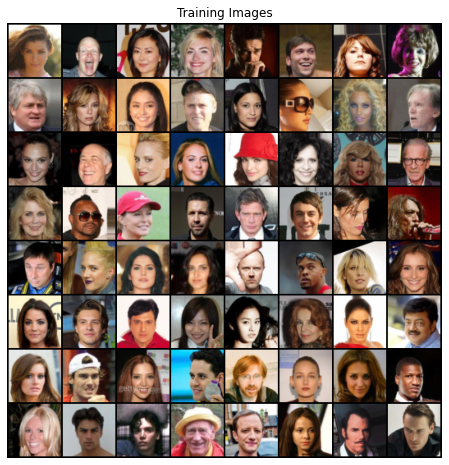

In [ ]:
#データセットとデータローダ

#create df
def get_df(df_path):
    with open(df_path, "r") as f:
      l = f.readlines()
    for i in range(len(l)):
      l[i] = l[i].replace("  ", " ").split(" ")
    l = np.array(l[1:])
    df = pd.DataFrame(l[1:, 1:])
    df.columns = l[0, :-1]
    df.index = l[1:, 0]
    #print(df)
    return df


# We can use an image folder dataset the way we have it setup.
# Create the dataset
class GanDataSet(Dataset):
    def __init__(self):
        self.paths = self.get_paths()
        self.df = get_df("list_attr_celeba.txt")
        self.transform = transforms.Compose([
                                    transforms.Resize(image_size),
                                    transforms.CenterCrop(image_size),
                                    transforms.ToTensor(),
                                    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
        ])

    #list of data paths
    def get_paths(self):
      paths = glob("%s/img_align_celeba/*.jpg"%dataroot)
      return paths

    #get data label from a path name
    def get_label(self, d_path, attr = "Male"):
        d = self.df.at[d_path, attr]
        if d == "1":
          label = 1
        elif d == "-1":
          label = 0
        else:
          label = -2
        return label
    
    #@functools.lru_cache(maxsize=500) # least recently used cache - 一番古く使われたものから消していく
    def __getitem__(self, index):
        img_path = self.paths[index]
        label = self.get_label(img_path[len("%s/img_align_celeba/"%dataroot):])
        data = Image.open(img_path)
        data = self.transform(data)
        return data, label

    def __len__(self):
        return len(self.paths)

"""
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
"""
# Create the 
dataset = GanDataSet()
print(dataset[0][0].shape)
dataloader = torch.utils.data.DataLoader(dataset, 
                                          batch_size=batch_size,
                                          shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [ ]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [ ]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.c1 = nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False)
        self.b1 = nn.BatchNorm2d(ngf * 8)
        self.c2 = nn.ConvTranspose2d( ngf * 8, ngf * 4, 4, 2, 1, bias=False)
        self.b2 = nn.BatchNorm2d(ngf * 4)
        self.c3 = nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False)
        self.b3 = nn.BatchNorm2d(ngf * 2)
        self.c4 = nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False)
        self.b4 = nn.BatchNorm2d(ngf)
        self.c5 = nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False)

    def forward(self, input):
        x = F.relu(self.b1(self.c1(input)))     
        x = F.relu(self.b2(self.c2(x)))
        x = F.relu(self.b3(self.c3(x)))
        x = F.relu(self.b4(self.c4(x)))
        y = F.tanh(self.c5(x))
        return y

In [ ]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (c1): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
  (b1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (c2): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (b2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (c3): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (b3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (c4): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (b4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (c5): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
)


Discriminator Code



In [ ]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.c1  = nn.Conv2d(nc, ndf, 4, 2, 1, bias=False)
        self.l1   = nn.LeakyReLU(0.2, inplace=True)
        self.c2  = nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False)
        self.b2  = nn.BatchNorm2d(ndf * 2)
        self.l2   = nn.LeakyReLU(0.2, inplace=True)
        self.c3  = nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False)
        self.b3  = nn.BatchNorm2d(ndf * 4)
        self.l3   = nn.LeakyReLU(0.2, inplace=True)
        self.c4  = nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False)
        self.b4  = nn.BatchNorm2d(ndf * 8)
        self.l4   = nn.LeakyReLU(0.2, inplace=True)
        self.c5  = nn.Conv2d(ndf*8, 1, 4, 1, 0, bias=False)
        self.l5   = nn.LeakyReLU(0.2, inplace = True)

    def forward(self, input):
        x = self.l1(self.c1(input))
        x = self.l2(self.b2(self.c2(x)))
        x = self.l3(self.b3(self.c3(x)))
        x = self.l4(self.b4(self.c4(x)))        
        y = F.sigmoid(self.c5(x))

        a = self.l1(self.c1(input))
        a = self.l2(self.b2(self.c2(a)))
        a = self.l3(self.b3(self.c3(a)))
        a = self.l4(self.b4(self.c4(a)))        
        c = F.sigmoid(self.c5(a))

        return y, c

In [ ]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))
    
# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (c1): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (l1): LeakyReLU(negative_slope=0.2, inplace=True)
  (c2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (b2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (l2): LeakyReLU(negative_slope=0.2, inplace=True)
  (c3): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (b3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (l3): LeakyReLU(negative_slope=0.2, inplace=True)
  (c4): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (b4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (l4): LeakyReLU(negative_slope=0.2, inplace=True)
  (c5): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
  (l5): LeakyReLU(negative_slope=0.2, inplace=True)
)


In [ ]:
#損失関数の定義
###クラスで書いとく
class StyleAmbiguityLoss(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, outputs):
        #loss = - sum(2**(-1) * np.log2(outputs) + (1 - 2**(-1)) * np.log2(1 - outputs))
        loss = - torch.sum(torch.add(torch.mul(torch.tensor(1/2), torch.log(outputs)), torch.mul(torch.sub(1, torch.tensor(1/2)), torch.log(torch.sub(1, outputs)))))
        return loss
  

In [ ]:
#損失関数とオプティマイザ

# Initialize BCELoss function
criterion = nn.BCELoss()
criterion_a = StyleAmbiguityLoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [ ]:
flag = False
if flag:
    netG.load_state_dict(torch.load("./../cclab_21s/model_g_100.dict"))
    netD.load_state_dict(torch.load("./../cclab_21s/model_d_100.dict"))

FileNotFoundError: ignored

In [ ]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):
        data, label_a = data
        label_a = label_a.to(device).float()
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        data = torch.unsqueeze(data, 0)
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu)#.view(-1)
        output_l = output[1].view(-1)
        output = output[0].view(-1)
        #print(output[0].shape, output[1].shape)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        errD_c     = criterion(output_l, label_a)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        errD_c.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach())
        output_l = output[1].view(-1)
        output = output[0].view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake + errD_c
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()

        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake)
        output_l = output[1].view(-1)
        output = output[0].view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        errG_a = criterion_a(output_l)
        # Calculate gradients for G
        errG.backward(retain_graph = True)
        errG_a.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()
        
        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
        
        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1
    if epoch % save_interval == 0:
        print("save model. ")
        #generator
        torch.save(netG, "%s/model_g_%d.pth"%(model_path, epoch))  # まるごとセーブ 
        torch.save(netG.state_dict(), "%s/model_g_%d.dict"%(model_path, epoch))    #重みセーブ
        #discriminator
        torch.save(netD, "%s/model_d_%d.pth"%(model_path, epoch))  # まるごとセーブ 
        torch.save(netD.state_dict(), "%s/model_d_%d.dict"%(model_path, epoch))    #重みセーブ


Starting Training Loop...


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:1628: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")


[0/130][0/47]	Loss_D: 2.6073	Loss_G: 6.2341	D(x): 0.5820	D(G(z)): 0.5501 / 0.0032
save model. 
[1/130][0/47]	Loss_D: 1.2289	Loss_G: 7.1736	D(x): 0.6445	D(G(z)): 0.0462 / 0.0011
[2/130][0/47]	Loss_D: 1.6450	Loss_G: 11.5488	D(x): 0.6457	D(G(z)): 0.2726 / 0.0000
[3/130][0/47]	Loss_D: 1.2432	Loss_G: 3.6060	D(x): 0.6862	D(G(z)): 0.0801 / 0.0409
[4/130][0/47]	Loss_D: 1.3444	Loss_G: 3.7111	D(x): 0.7914	D(G(z)): 0.1896 / 0.0328
[5/130][0/47]	Loss_D: 1.6161	Loss_G: 2.3001	D(x): 0.4670	D(G(z)): 0.0581 / 0.1540
[6/130][0/47]	Loss_D: 1.3289	Loss_G: 2.8482	D(x): 0.6595	D(G(z)): 0.2047 / 0.0730
[7/130][0/47]	Loss_D: 1.2763	Loss_G: 4.1238	D(x): 0.7668	D(G(z)): 0.1089 / 0.0212
[8/130][0/47]	Loss_D: 1.3060	Loss_G: 2.7966	D(x): 0.6134	D(G(z)): 0.1206 / 0.0755
[9/130][0/47]	Loss_D: 1.2939	Loss_G: 3.7622	D(x): 0.7481	D(G(z)): 0.2486 / 0.0362
[10/130][0/47]	Loss_D: 1.3903	Loss_G: 3.3089	D(x): 0.8007	D(G(z)): 0.2991 / 0.0475
[11/130][0/47]	Loss_D: 1.3876	Loss_G: 2.1242	D(x): 0.5783	D(G(z)): 0.1200 / 0.1570


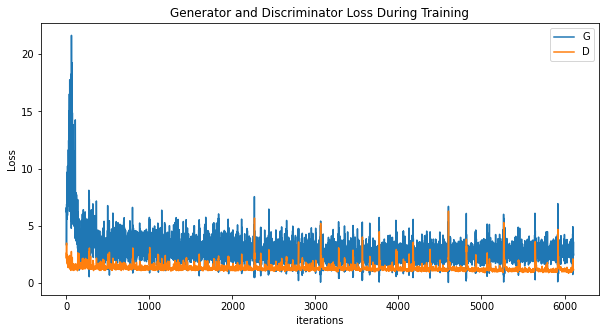

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

**Visualization of G’s progression**

Remember how we saved the generator’s output on the fixed_noise batch
after every epoch of training. Now, we can visualize the training
progression of G with an animation. Press the play button to start the
animation.




In [ ]:
!apt install ffmpeg

Reading package lists... Done
Building dependency tree       
Reading state information... Done
ffmpeg is already the newest version (7:3.4.8-0ubuntu0.2).
0 upgraded, 0 newly installed, 0 to remove and 29 not upgraded.


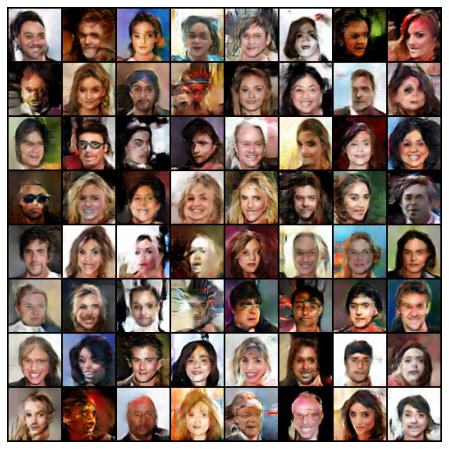

In [ ]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)
#ani.save('../cclab_21s/anim.gif', writer="imagemagick")
ani.save('../cclab_21s/anim.gif', writer="pillow")
HTML(ani.to_jshtml())

**Real Images vs. Fake Images**

Finally, lets take a look at some real images and fake images side by
side.




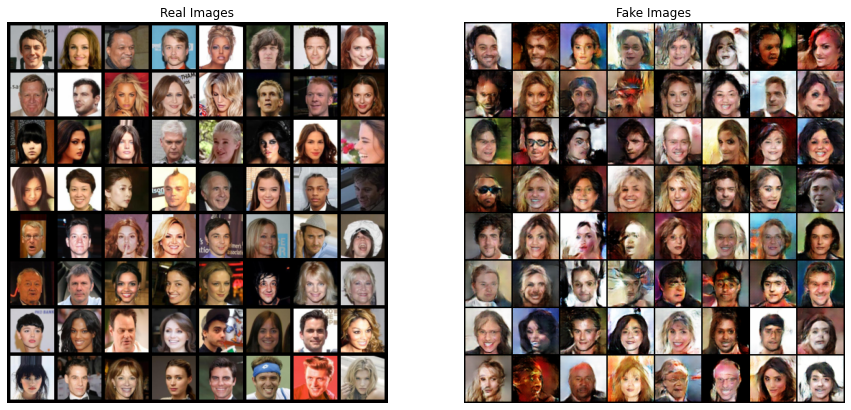

In [ ]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()